<a href="https://colab.research.google.com/github/marianaadmc/ApPsiquiatry/blob/main/Segmentacion_sondas_SAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **SET UP MÉTODO AUTOMÁTICO SAM**

In [1]:
from IPython.display import display, HTML
display(HTML(
"""
<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything/blob/main/notebooks/automatic_mask_generator_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>
"""
))

In [2]:
using_colab = True

In [3]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg

    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.3.0+cu121
Torchvision version: 0.18.0+cu121
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-d4kcrqmd
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-d4kcrqmd
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36590 sha256=059621e846b32b9130bc7173a95853eed8a51aa4a77301c15913b3b387683049
  Stored in directory: /tmp/pip-ephem-wheel-cache-r_hw6v9g/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything
--2024-06-24 06:43:34--  https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com

In [28]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
from PIL import Image

In [5]:
#Función para mostrar las máscaras encima de una imagen VERDE
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = [np.concatenate([np.random.random(3), [0.35]])]
        img[m] = color_mask
    ax.imshow(img)

In [6]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

## Ajuste de parámetros para mask_generator_2

In [7]:
mask_generator_sondas = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32, #Los puntos que formas la red del modelo sobre la imagen
    pred_iou_thresh=0.86,  #Calidad mínima
    stability_score_thresh=0.92,  #Calidad mínima
    crop_n_layers=1,
    crop_n_points_downscale_factor=0.25, #Mejora la detección de objetos pequeños
    min_mask_region_area=0,  #Tamaño mínimo de objeto que segmenta
)

In [8]:
mask_generator_cels = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32, #Los puntos que formas la red del modelo sobre la imagen
    pred_iou_thresh=0.86,  #Calidad mínima
    stability_score_thresh=0.92,  #Calidad mínima
    crop_n_layers=1,
    crop_n_points_downscale_factor=2, #Mejora la detección de objetos pequeños
    min_mask_region_area=100,  #Tamaño mínimo de objeto que segmenta
)

# **CÓDIGO TFG VERA**

In [11]:
from skimage.filters import threshold_yen
import numpy as np
from skimage.measure import label, regionprops
from skimage import color
import matplotlib.pyplot as plt
import json
from skimage.io import imread, imshow
from skimage import filters
from math import floor
from skimage.morphology import closing, disk, diamond, square, star
from skimage import feature
from scipy import ndimage
from statistics import mean
import pandas as pd
from skimage.draw import polygon
import seaborn as sns
import ipywidgets as widgets
from skimage import io
from scipy.stats import ttest_rel
from IPython.display import display, clear_output


def metodo_otsu(self, imagen):
  '''Función para umbralizar una imagen por el método Otsu'''
  umbral = floor(filters.threshold_otsu(imagen))
  resultado = imagen > umbral
  return resultado

def metodo_li(self, imagen):
  '''Función para umbralizar una imagen por el método Li'''
  umbral = floor(filters.threshold_li(imagen))
  binary = imagen > umbral
  return binary

def filtrado_filters(self, original, imagen, filtro):
  '''Función para filtrar los resultados de la segmentación de células, se utiliza un filtro de 300000 a 3000'''
  label_img = label(imagen)
  regions = regionprops(label_img)
  imagen_filtrada = label_img.copy()
  regiones = []

  for i,region in enumerate(regions):
    if region.area <= 300000 and region.area >= 3000: #and region.eccentricity < 0.8:
      regiones.append(region)
      imagen_filtrada[imagen_filtrada == (i+1)] = 1
    else:
      imagen_filtrada[imagen_filtrada == (i+1)] = 0


  detectada = filtro(imagen_filtrada.astype(float))


  org = original.copy()
  x,y = detectada.shape
  for i in range(0,x):
    for j in range(0,y):
      if filtro == feature.canny:
        if detectada[i][j] == True:
          org[i][j][0] = 255
          org[i][j][1] = 255
          org[i][j][2] = 255
        else:
          if detectada[i][j] != 0:
            org[i][j][0] = 255
            org[i][j][1] = 255
            org[i][j][2] = 255
  return org

def interseccion_sobre_union(self, gt, mascara):
  '''Función que realiza el calculo de la calidad, intersección sobre unión,
  recibe una imagen groundtruth, y la mascara obtenida de la segmentación que se corresponde con las mismas sondas'''
  interseccion = np.logical_and(mascara, gt)
  union = np.logical_or(mascara, gt)

  return np.sum(interseccion)/np.sum(union)


def dropdown_unica_forma(self):
  '''Función dropdown en la que se elige la imagen a segmentar, y por defecto se aplica el mejro cierre, star(6)'''
  opciones = ["None","fish", "imagen1_1", "imagen1_2", "imagen1_3", "imagen2_1", "imagen2_2", "imagen2_3", "imagen2_4",
              "imagen2_5", "imagen3_1", "imagen3_2"]
  dropdown = widgets.Dropdown(options=opciones, value=opciones[0], description='Selecciona una opción:')

In [21]:
widgets.Dropdown(options = ['None', 'image0161', 'image2472', 'image2949'], value='None', description='Selecciona una opción:')

Dropdown(description='Selecciona una opción:', options=('None', 'image0161', 'image2472', 'image2949'), value=…

# **Imagen 2472**

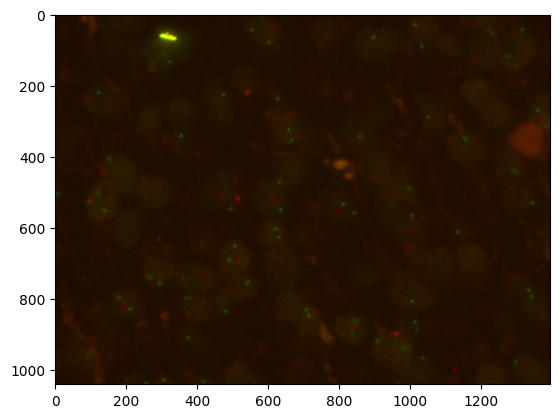

In [23]:
fish_2472 = io.imread("images/image2472.jpg")
plt.imshow(fish_2472)

Solamente con el "mask_generator_2" con los parámetros adecuados y un filtrado por tamaño conseguimos segmentar sólo las sondas.

El problema es que no distingue entre el color de las sondas ni entre las que están dentro o fuera de la célula. Además, no reconoce todas las sondas.

In [ ]:
masks_2472 = mask_generator_sondas.generate(fish_2472)

In [ ]:
#Filtro el tamaño de las máscaras para que sólo muestre las de las sondas.
masks_2472_filtrar_tamaño = []
for mask in masks_2472:
  if mask['area'] < 150 and mask['area'] > 0:
    masks_2472_filtrar_tamaño.append(mask)

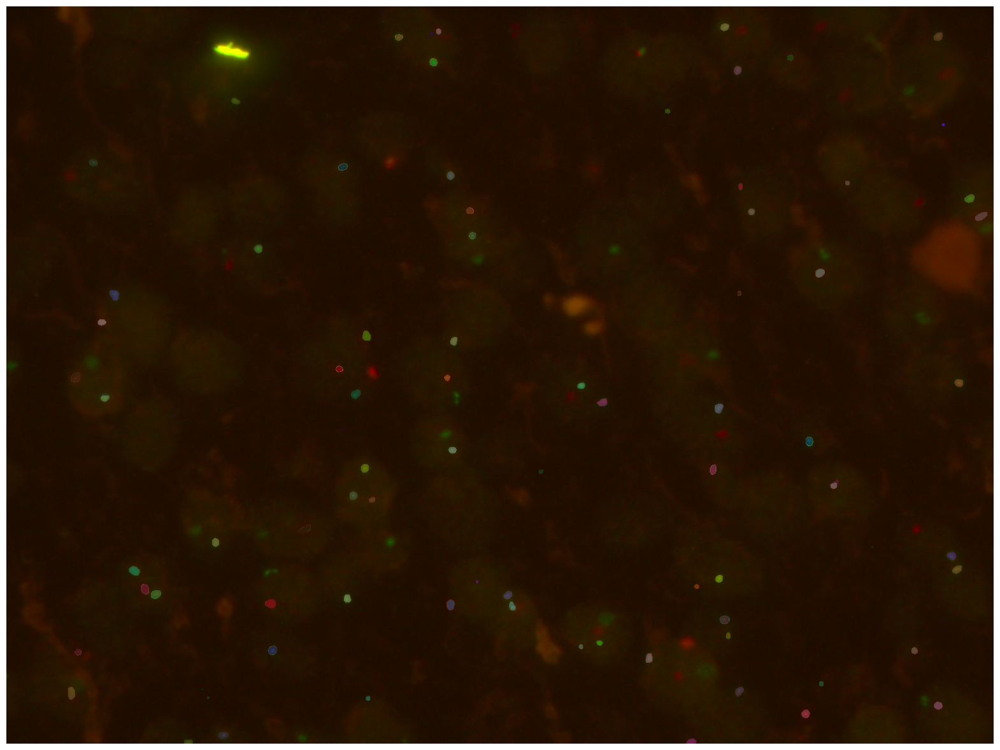

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fish_2472)
show_anns(masks_2472_filtrar_tamaño)
plt.axis('off')
plt.show()

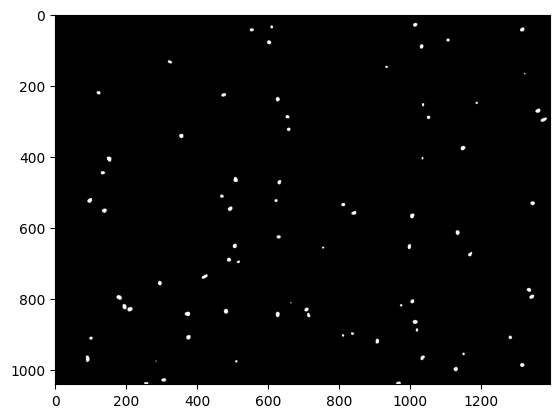

In [ ]:
mask_bin_2472 = np.zeros(fish_2472.shape[:2])
for mask in masks_2472_filtrar_tamaño:
  mask = mask['segmentation']
  for x in range(0, mask.shape[0]):
    for y in range(0, mask.shape[1]):
      if mask[x][y] == True:
        mask_bin_2472[x][y] = 1
plt.imshow(mask_bin_2472, cmap='gray')

image = Image.fromarray(mask_bin_2472.astype(np.uint8))
image.save('images/sondas_2472_bin.jpg')

# Métricas de calidad

4862 27411
0.1773740469154719


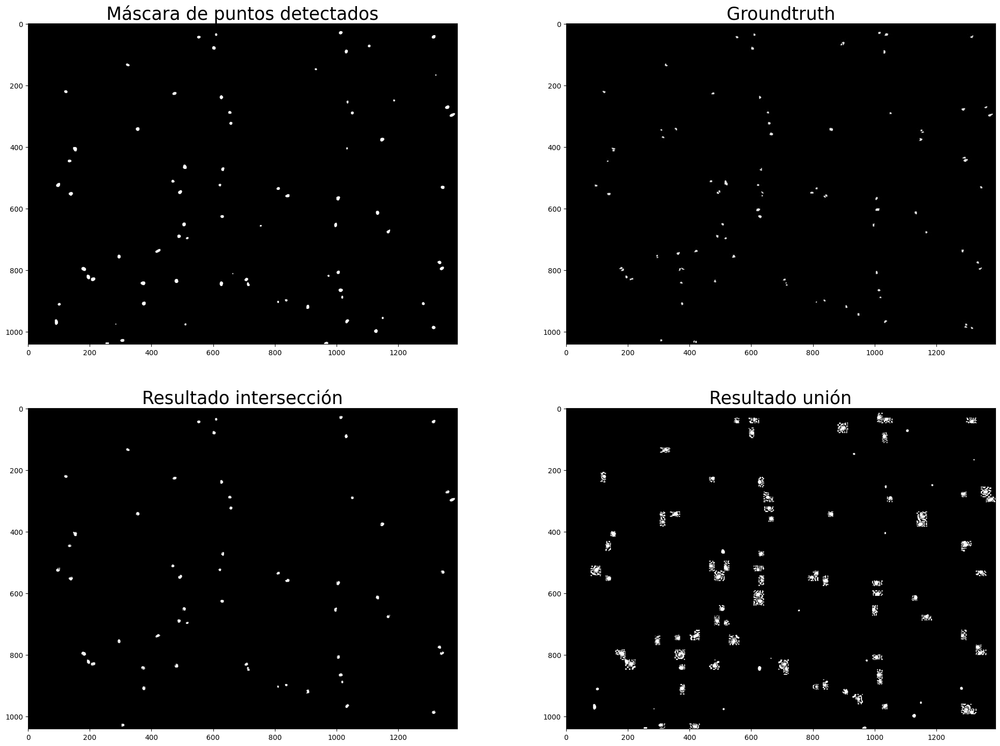

In [ ]:
gt_2742 = io.imread(fname="images/GT_image2472.jpg")

gt_2742_bin = np.zeros(gt_2742.shape[:2])

for x in range(0, gt_2742.shape[0]):
  for y in range(0, gt_2742.shape[1]):
    gt_2742_bin[x][y] = gt_2742[x][y][1]

interseccion_sobre_union(gt_2742_bin,mask_bin_2472)


Ahora segmentamos sólo las células filtrando por un tamaño más grande.

In [ ]:
masks_2472_cels = mask_generator_cels.generate(fish_2472)

In [ ]:
#Filtro el tamaño de las máscaras para que sólo muestre las de las células.
masks_2472_cels_filtrar_tamaño = []
for mask in masks_2472_cels:
  if mask['area'] > 3000 and mask['area'] < 300000:
    masks_2472_cels_filtrar_tamaño.append(mask)

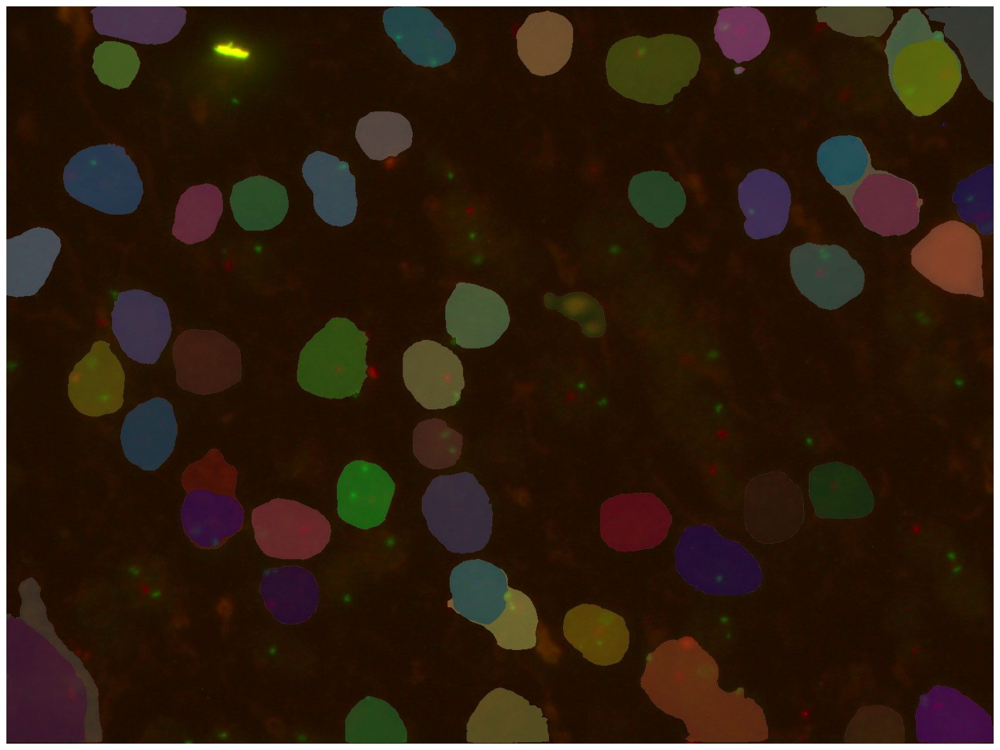

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fish_2472)
show_anns(masks_2472_cels_filtrar_tamaño)
plt.axis('off')
plt.show()

In [ ]:
mask_2472_sondas_filtrado = []
for son in masks_2472_filtrar_tamaño:
  for cel in masks_2472_cels_filtrar_tamaño:
    if (son['point_coords'][0][0] > cel['bbox'][0] and son['point_coords'][0][0] < cel['bbox'][0]+cel['bbox'][2]) and (son['point_coords'][0][1] > cel['bbox'][1] and son['point_coords'][0][1] < cel['bbox'][1]+cel['bbox'][3]):
      mask_2472_sondas_filtrado.append(son)



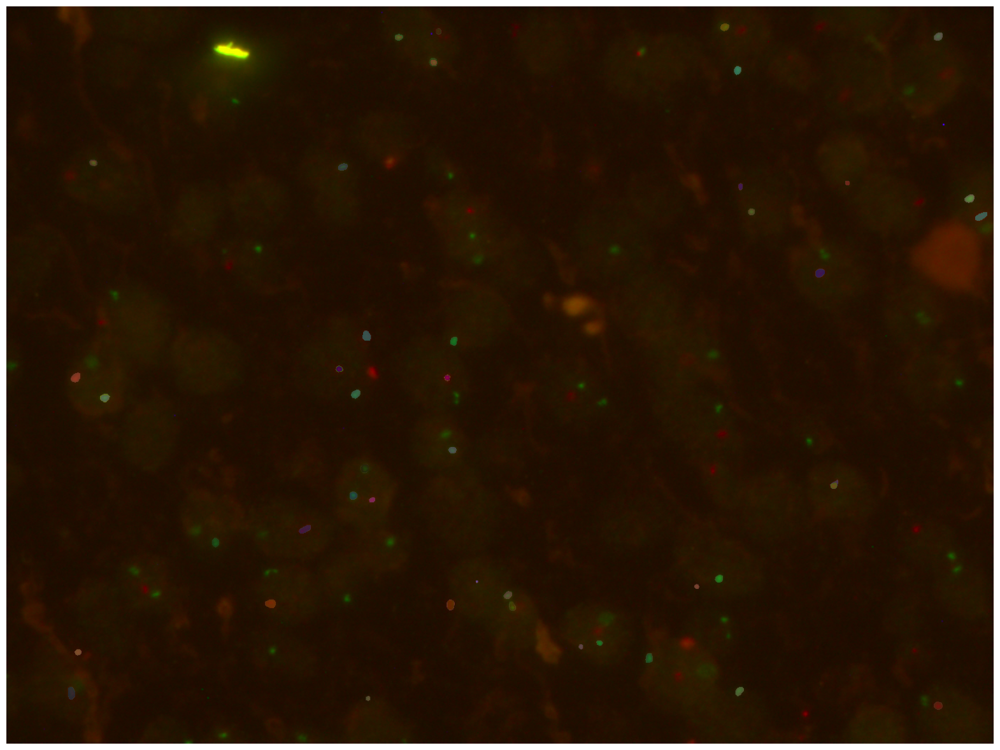

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fish_2472)
show_anns(mask_2472_sondas_filtrado)
plt.axis('off')
plt.show()

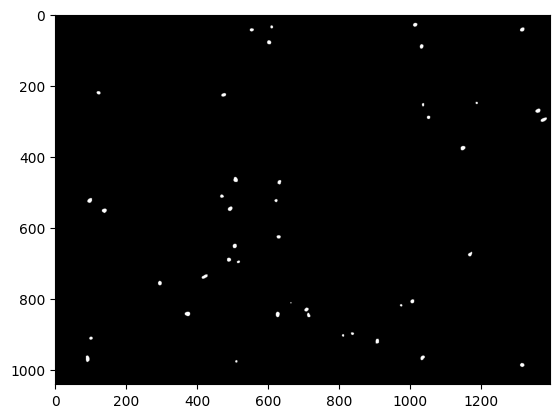

In [ ]:
sondas_2472_filtrado = np.zeros(fish_2472.shape[:2])
for mask in mask_2472_sondas_filtrado:
  mask = mask['segmentation']
  for x in range(0, mask.shape[0]):
    for y in range(0, mask.shape[1]):
      if mask[x][y] == True:
        sondas_2472_filtrado[x][y] = 1
plt.imshow(sondas_2472_filtrado, cmap='gray')

2785 26466
0.10522935086526108


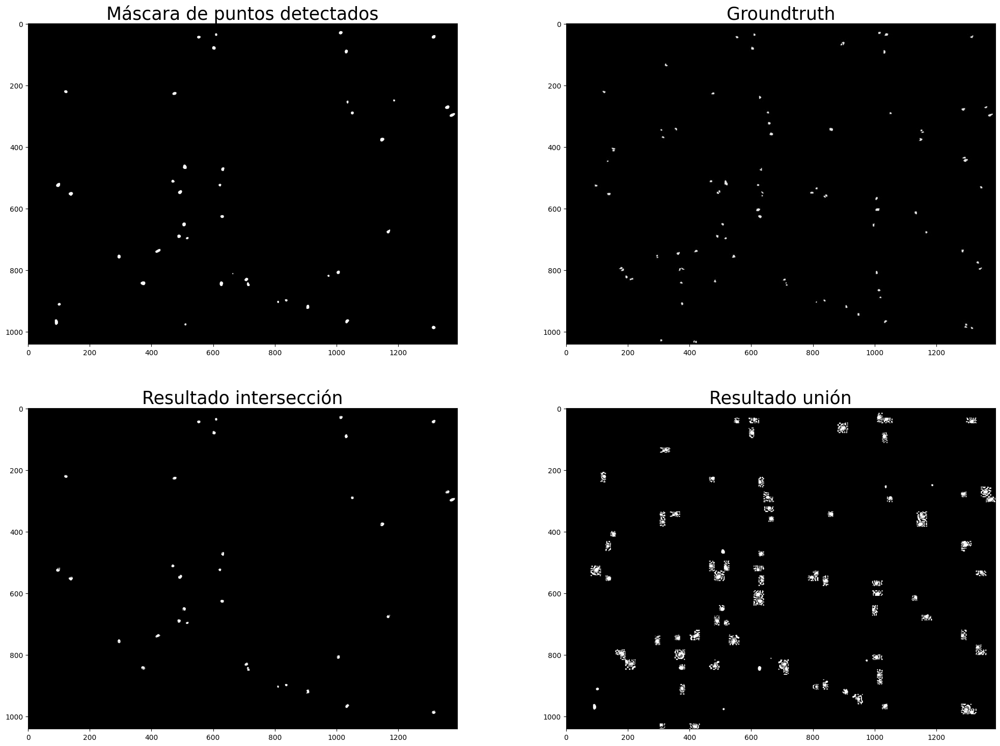

In [ ]:
interseccion_sobre_union(gt_2742_bin,sondas_2472_filtrado)

# **Imagen 2949**

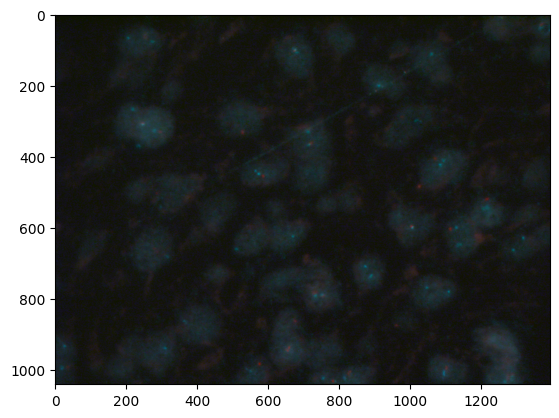

In [24]:
fish_2949 = io.imread("images/image2949.jpg")
plt.imshow(fish_2949)

Generamos las sondas de la misma manera que con la imagen anterior.

In [ ]:
masks_2949 = mask_generator_sondas.generate(fish_2949)

In [ ]:
masks_2949_filtrar_tamaño = []
for mask in masks_2949:
  if mask['area'] < 150 and mask['area'] > 0:
    masks_2949_filtrar_tamaño.append(mask)

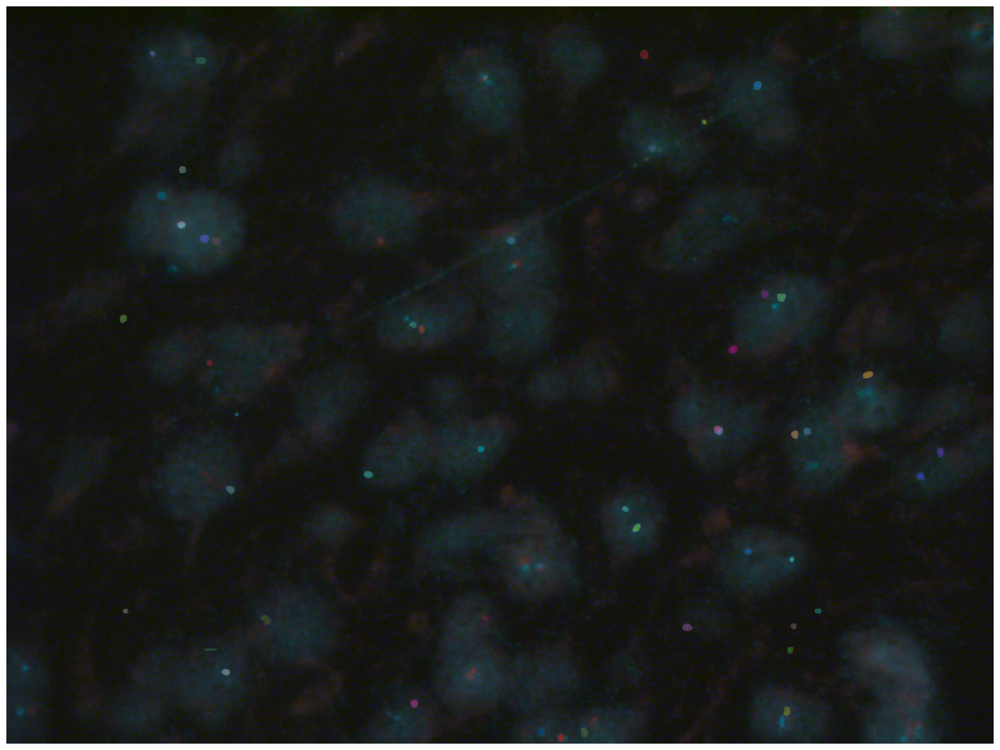

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fish_2949)
show_anns(masks_2949_filtrar_tamaño)
plt.axis('off')
plt.show()

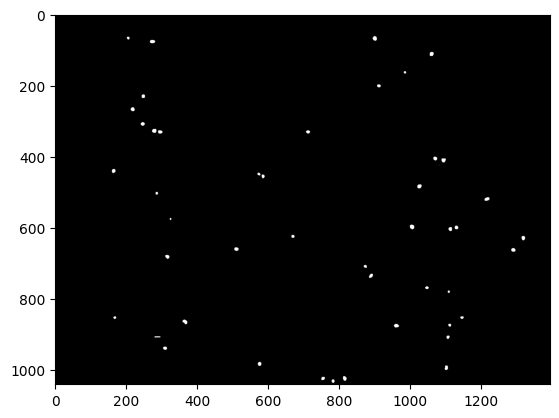

In [ ]:
mask_bin_2949 = np.zeros(fish_2949.shape[:2])
for mask in masks_2949_filtrar_tamaño:
  mask = mask['segmentation']
  for x in range(0, mask.shape[0]):
    for y in range(0, mask.shape[1]):
      if mask[x][y] == True:
        mask_bin_2949[x][y] = 1
plt.imshow(mask_bin_2949, cmap='gray')

image = Image.fromarray(mask_bin_2949.astype(np.uint8))
image.save('images/sondas_2949_bin.jpg')

2589 20375
0.1270674846625767


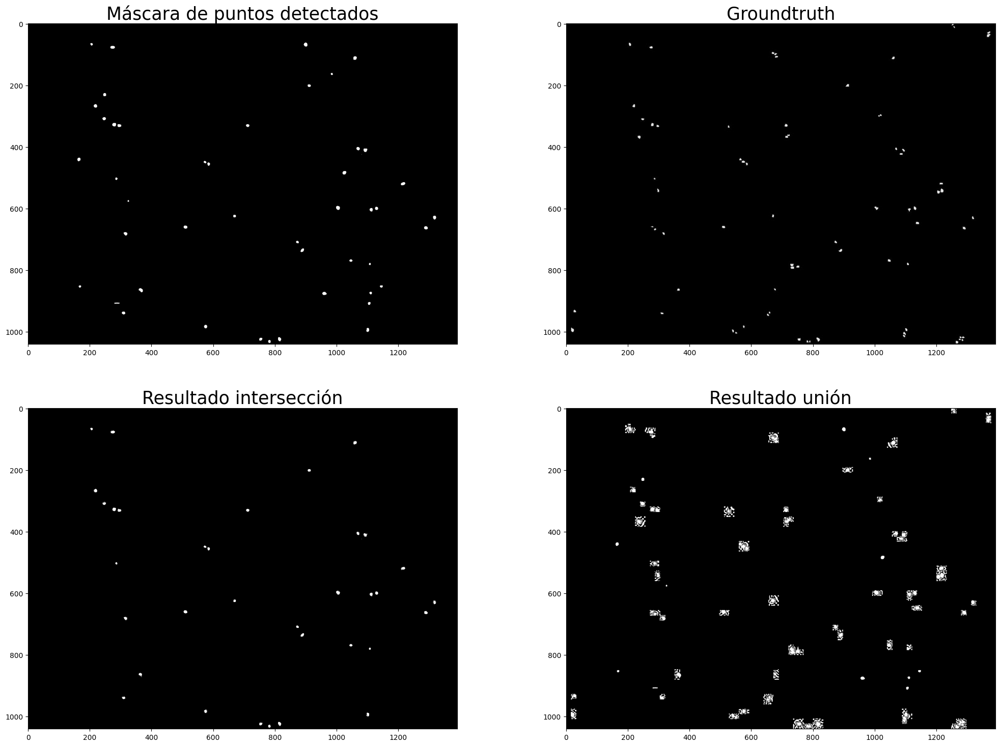

In [ ]:
gt_2949 = io.imread(fname="images/gt_image2949.jpg")

gt_2949_bin = np.zeros(gt_2949.shape[:2])

for x in range(0, gt_2949.shape[0]):
  for y in range(0, gt_2949.shape[1]):
    gt_2949_bin[x][y] = gt_2949[x][y][1]

c.interseccion_sobre_union_imagenes(gt_2949_bin,mask_bin_2949)

In [ ]:
masks_2949_cels = mask_generator_cels.generate(fish_2949)

In [ ]:
masks_2949_cels_filtrar_tamaño = []
for mask in masks_2949_cels:
  if mask['area'] > 3000 and mask['area'] < 300000:
    masks_2949_cels_filtrar_tamaño.append(mask)

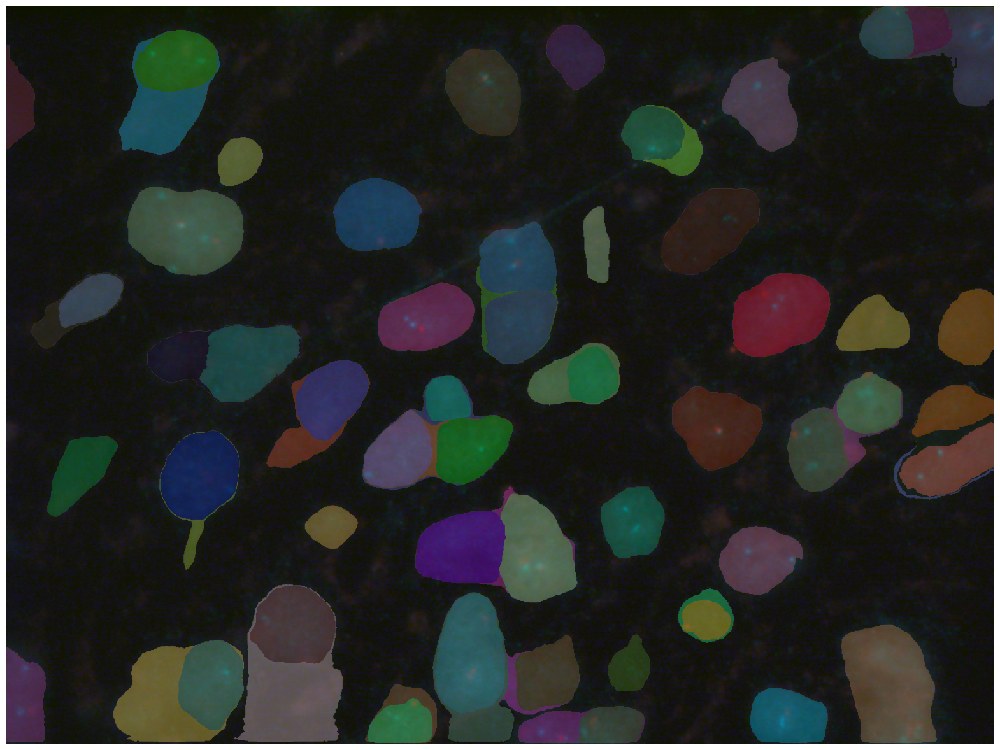

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fish_2949)
show_anns(masks_2949_cels_filtrar_tamaño)
plt.axis('off')
plt.show()

In [ ]:
mask_2949_sondas_filtrado = []
for son in masks_2949_filtrar_tamaño:
  for cel in masks_2949_cels_filtrar_tamaño:
    if (son['point_coords'][0][0] > cel['bbox'][0] and son['point_coords'][0][0] < cel['bbox'][0]+cel['bbox'][2]) and (son['point_coords'][0][1] > cel['bbox'][1] and son['point_coords'][0][1] < cel['bbox'][1]+cel['bbox'][3]):
      mask_2949_sondas_filtrado.append(son)


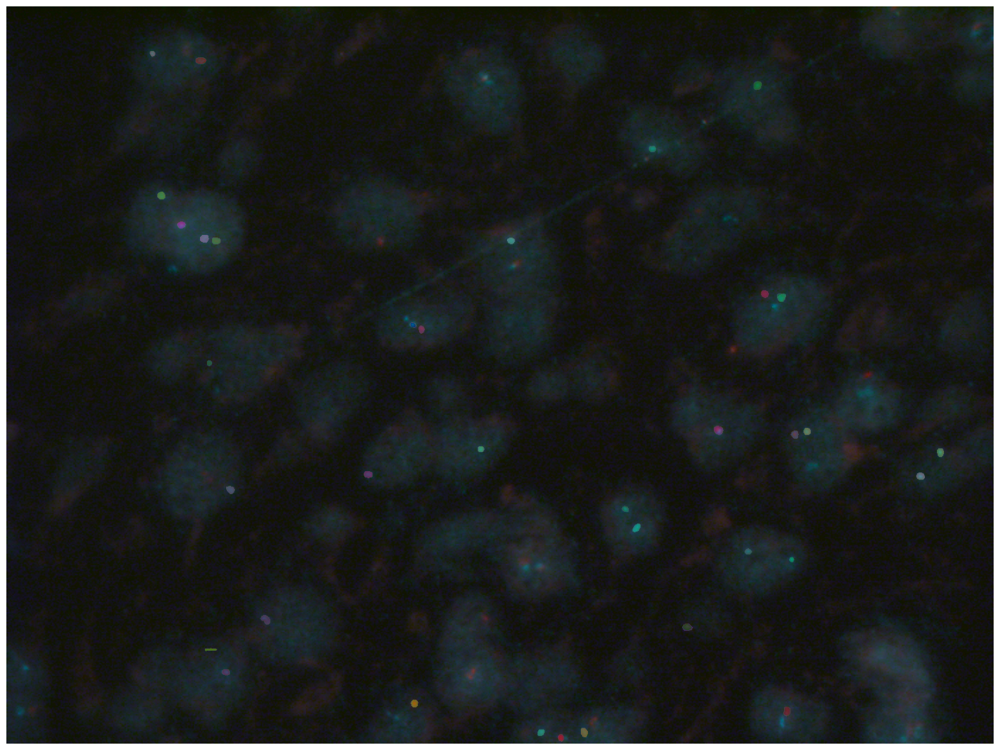

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fish_2949)
show_anns(mask_2949_sondas_filtrado)
plt.axis('off')
plt.show()

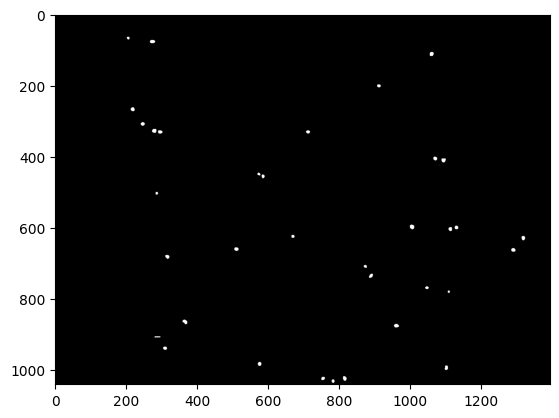

In [ ]:
sondas_2949_filtrado = np.zeros(fish_2949.shape[:2])
for mask in mask_2949_sondas_filtrado:
  mask = mask['segmentation']
  for x in range(0, mask.shape[0]):
    for y in range(0, mask.shape[1]):
      if mask[x][y] == True:
        sondas_2949_filtrado[x][y] = 1
plt.imshow(sondas_2949_filtrado, cmap='gray')

2495 19676
0.12680422850172798


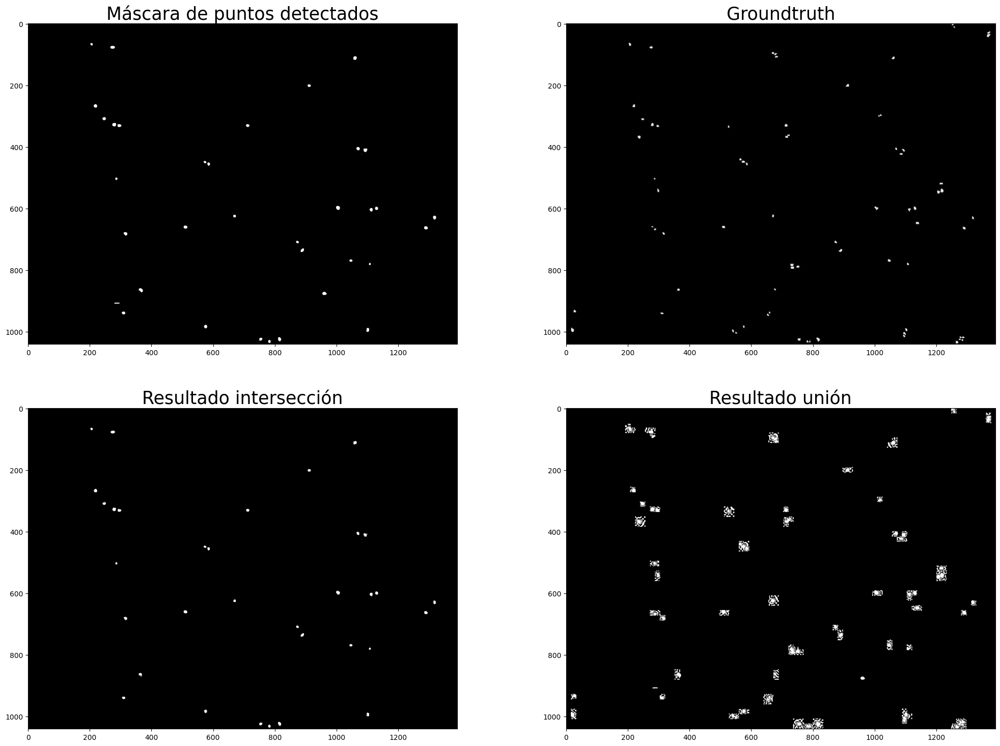

In [ ]:
interseccion_sobre_union(gt_2949_bin,sondas_2949_filtrado)

# **Imagen 0161**

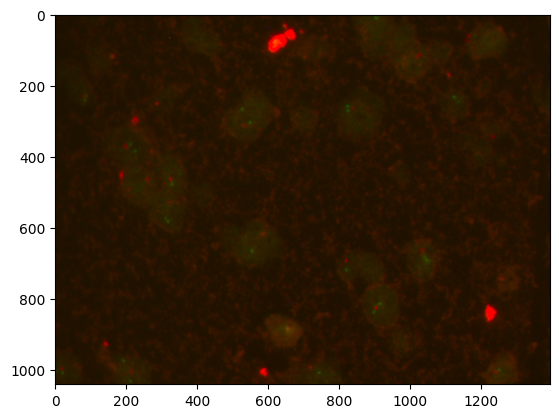

In [25]:
fish_0161 = io.imread("images/image0161.jpg")
plt.imshow(fish_0161)

In [27]:
masks_0161 = mask_generator_sondas.generate(fish_0161)

KeyboardInterrupt: 

In [ ]:
masks_0161_filtrar_tamaño = []
for mask in masks_0161:
  if mask['area'] < 150 and mask['area'] > 0:
    masks_0161_filtrar_tamaño.append(mask)

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fish_0161)
show_anns(masks_0161_filtrar_tamaño)
plt.axis('off')
plt.show()

In [ ]:
mask_bin_0161 = np.zeros(fish_0161.shape[:2])
for mask in masks_0161_filtrar_tamaño:
  mask = mask['segmentation']
  for x in range(0, mask.shape[0]):
    for y in range(0, mask.shape[1]):
      if mask[x][y] == True:
        mask_bin_0161[x][y] = 1
plt.imshow(mask_bin_0161, cmap='gray')

image = Image.fromarray(mask_bin_0161.astype(np.uint8))
image.save('images/sondas_0161_bin.jpg')

In [ ]:
gt_0161 = io.imread(fname="images/gt_image0161.jpg")

gt_0161_bin = np.zeros(gt_0161.shape[:2])

for x in range(0, gt_0161.shape[0]):
  for y in range(0, gt_0161.shape[1]):
    gt_0161_bin[x][y] = gt_0161[x][y][1]

interseccion_sobre_union(gt_0161_bin,mask_bin_0161)

In [ ]:
masks_0161_cels = mask_generator_cels.generate(fish_0161)

In [ ]:
masks_0161_cels_filtrar_tamaño = []
for mask in masks_0161_cels:
  if mask['area'] > 3000 and mask['area'] < 300000:
    masks_0161_cels_filtrar_tamaño.append(mask)

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fish_0161)
show_anns(masks_0161_cels_filtrar_tamaño)
plt.axis('off')
plt.show()

In [ ]:
mask_0161_sondas_filtrado = []
for son in masks_0161_filtrar_tamaño:
  for cel in masks_0161_cels_filtrar_tamaño:
    if (son['point_coords'][0][0] > cel['bbox'][0] and son['point_coords'][0][0] < cel['bbox'][0]+cel['bbox'][2]) and (son['point_coords'][0][1] > cel['bbox'][1] and son['point_coords'][0][1] < cel['bbox'][1]+cel['bbox'][3]):
      mask_0161_sondas_filtrado.append(son)


In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fish_0161)
show_anns(mask_0161_sondas_filtrado)
plt.axis('off')
plt.show()

In [ ]:
sondas_0161_filtrado = np.zeros(fish_0161.shape[:2])
for mask in mask_0161_sondas_filtrado:
  mask = mask['segmentation']
  for x in range(0, mask.shape[0]):
    for y in range(0, mask.shape[1]):
      if mask[x][y] == True:
        sondas_0161_filtrado[x][y] = 1
plt.imshow(sondas_0161_filtrado, cmap='gray')

In [ ]:
interseccion_sobre_union(gt_0161_bin,sondas_0161_filtrado)